In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
import seaborn as sns
import math
import numpy as np
from IPython.display import display, Latex


In [2]:
df = pd.read_csv('data-melbourne.csv')
df = df.drop('VG', axis=1)

In [3]:
bins = [0, 210000, 304000, float('inf')]    # ranges for classification
labels = ['level 1', 'level 2', 'level 3']  # levels' labels

df['consumption_level'] = pd.cut(df['total_grid'], bins=bins, labels=labels, right=False)

df['date'] = pd.to_datetime(df[['year', 'month', 'day']])

In [4]:
df

,avg_outflow,avg_inflow,total_grid,Am,BOD,COD,TN,T,TM,Tm,...,H,PP,VV,V,VM,year,month,day,consumption_level,date
0,2.941,2.589,175856,27.0,365.0,730.0,60.378,19.3,25.1,12.6,...,56,1.52,10.0,26.9,53.5,2014,1,1,level 1,2014-01-01
1,2.936,2.961,181624,25.0,370.0,740.0,60.026,17.1,23.6,12.3,...,63,0.00,10.0,14.4,27.8,2014,1,2,level 1,2014-01-02
2,2.928,3.225,202016,42.0,418.0,836.0,64.522,16.8,27.2,8.8,...,47,0.25,10.0,31.9,61.1,2014,1,5,level 1,2014-01-05
3,2.928,3.354,207547,36.0,430.0,850.0,63.000,14.6,19.9,11.1,...,49,0.00,10.0,27.0,38.9,2014,1,6,level 1,2014-01-06
4,2.917,3.794,202824,46.0,508.0,1016.0,65.590,13.4,19.1,8.0,...,65,0.00,10.0,20.6,35.2,2014,1,7,level 1,2014-01-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1377,5.068,4.716,305938,28.0,310.0,660.0,58.807,6.8,10.0,4.0,...,56,0.00,10.0,14.4,22.2,2019,6,20,level 3,2019-06-20
1378,5.882,5.510,293446,40.0,250.0,700.0,60.671,7.6,16.0,3.0,...,71,0.00,0.0,13.5,25.9,2019,6,24,level 2,2019-06-24
1379,4.638,4.811,307968,47.0,260.0,860.0,64.000,9.7,16.0,3.0,...,65,0.00,10.0,18.1,25.9,2019,6,25,level 3,2019-06-25
1380,5.373,4.929,316675,46.0,300.0,900.0,62.479,10.9,17.0,5.0,...,65,0.00,10.0,21.9,35.2,2019,6,26,level 3,2019-06-26


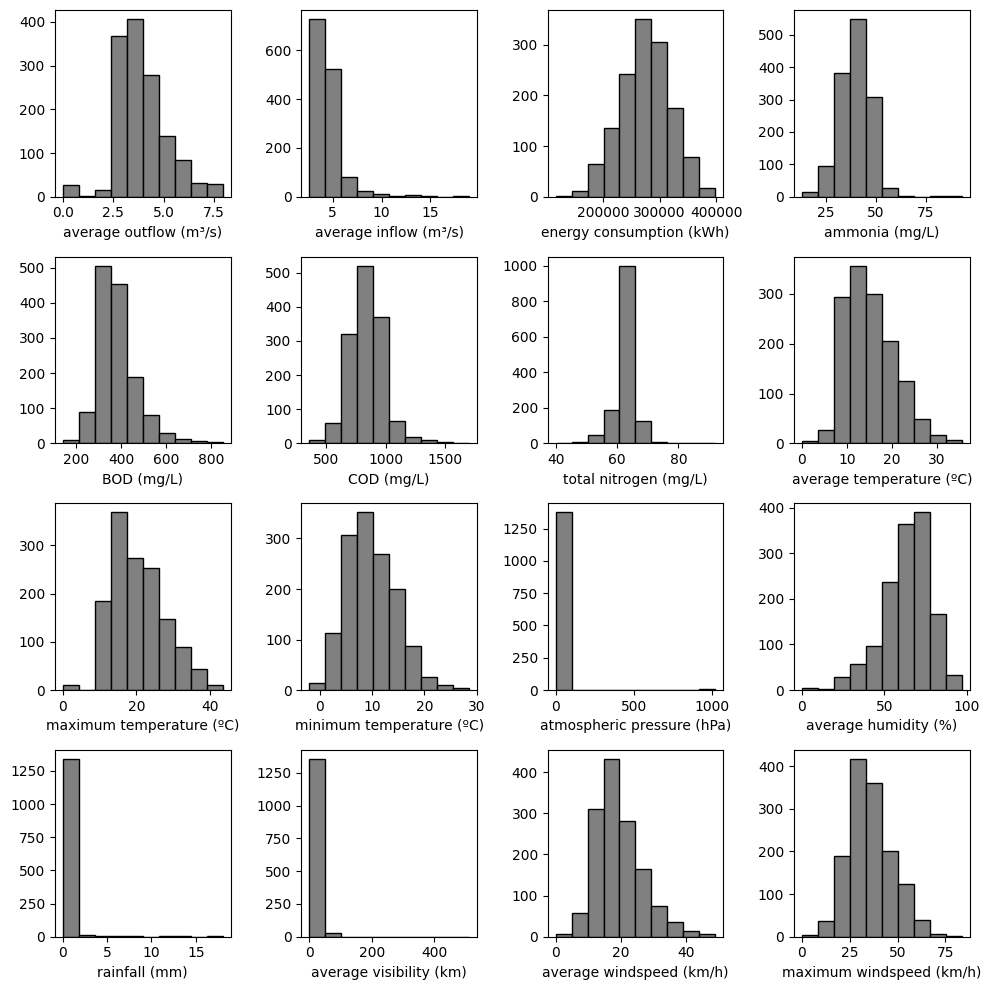

In [5]:
columns_to_plot = ['avg_outflow','avg_inflow','total_grid','Am','BOD','COD','TN','T','TM','Tm','SLP','H','PP','VV','V','VM','VG']

num_columns = 4
num_rows = 4

fig, axes = plt.subplots(num_rows, num_columns, figsize=(10, 10))

axes = axes.flatten()

axes[0].hist(df['avg_outflow'], bins=10, color='grey', edgecolor='black')
axes[0].set_xlabel('average outflow (m³/s)')

axes[1].hist(df['avg_inflow'], bins=10, color='grey', edgecolor='black')
axes[1].set_xlabel('average inflow (m³/s)')

axes[2].hist(df['total_grid'], bins=10, color='grey', edgecolor='black')
axes[2].set_xlabel('energy consumption (kWh)')

axes[3].hist(df['Am'], bins=10, color='grey', edgecolor='black')
axes[3].set_xlabel('ammonia (mg/L)')

axes[4].hist(df['BOD'], bins=10, color='grey', edgecolor='black')
axes[4].set_xlabel('BOD (mg/L)')

axes[5].hist(df['COD'], bins=10, color='grey', edgecolor='black')
axes[5].set_xlabel('COD (mg/L)')

axes[6].hist(df['TN'], bins=10, color='grey', edgecolor='black')
axes[6].set_xlabel('total nitrogen (mg/L)')

axes[7].hist(df['T'], bins=10, color='grey', edgecolor='black')
axes[7].set_xlabel('average temperature (ºC)')

axes[8].hist(df['TM'], bins=10, color='grey', edgecolor='black')
axes[8].set_xlabel('maximum temperature (ºC)')

axes[9].hist(df['Tm'], bins=10, color='grey', edgecolor='black')
axes[9].set_xlabel('minimum temperature (ºC)')

axes[10].hist(df['SLP'], bins=10, color='grey', edgecolor='black')
axes[10].set_xlabel('atmospheric pressure (hPa)')

axes[11].hist(df['H'], bins=10, color='grey', edgecolor='black')
axes[11].set_xlabel('average humidity (%)')

axes[12].hist(df['PP'], bins=10, color='grey', edgecolor='black')
axes[12].set_xlabel('rainfall (mm)')

axes[13].hist(df['VV'], bins=10, color='grey', edgecolor='black')
axes[13].set_xlabel('average visibility (km)')

axes[14].hist(df['V'], bins=10, color='grey', edgecolor='black')
axes[14].set_xlabel('average windspeed (km/h)')

axes[15].hist(df['VM'], bins=10, color='grey', edgecolor='black')
axes[15].set_xlabel('maximum windspeed (km/h)')

plt.tight_layout()

plt.show()

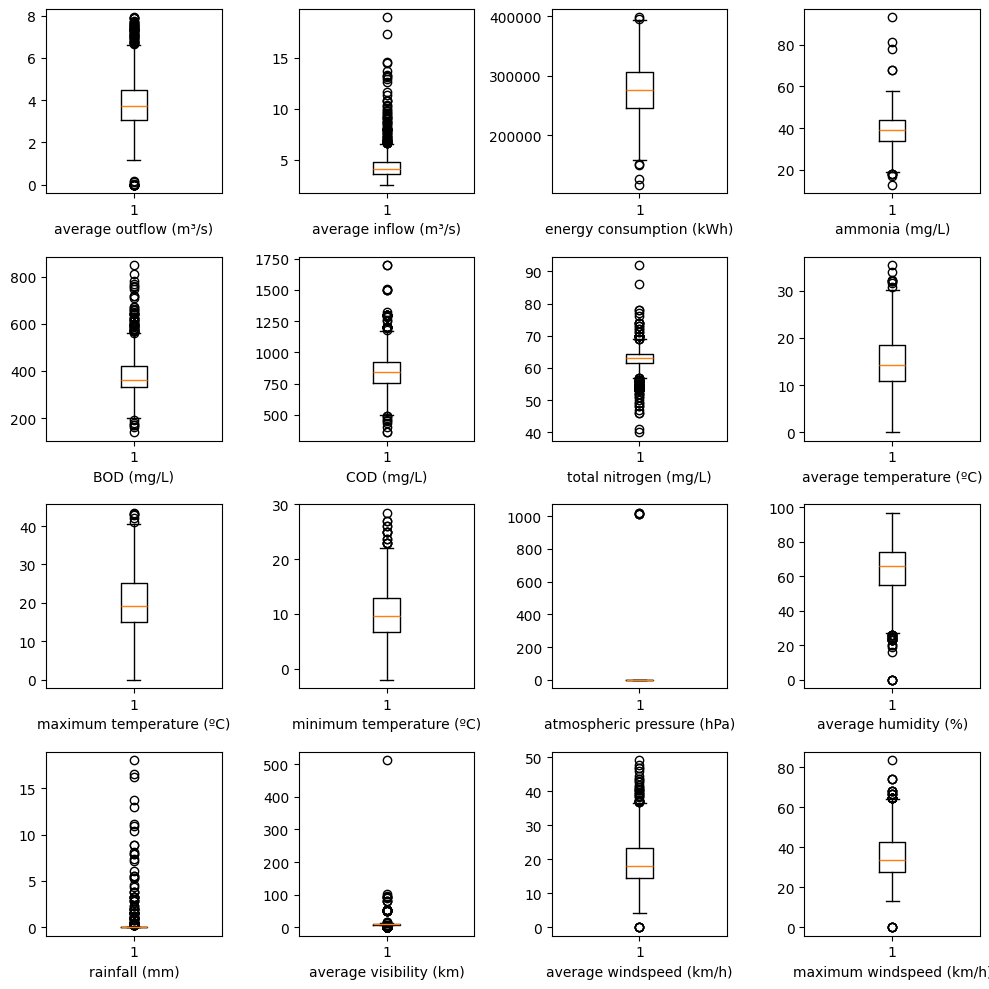

In [6]:
columns_to_plot = ['avg_outflow','avg_inflow','total_grid','Am','BOD','COD','TN','T','TM','Tm','SLP','H','PP','VV','V','VM','VG']

num_columns = 4
num_rows = 4

fig, axes = plt.subplots(num_rows, num_columns, figsize=(10, 10))

axes = axes.flatten()

axes[0].boxplot(df['avg_outflow'])
axes[0].set_xlabel('average outflow (m³/s)')

axes[1].boxplot(df['avg_inflow'])
axes[1].set_xlabel('average inflow (m³/s)')

axes[2].boxplot(df['total_grid'])
axes[2].set_xlabel('energy consumption (kWh)')

axes[3].boxplot(df['Am'])
axes[3].set_xlabel('ammonia (mg/L)')

axes[4].boxplot(df['BOD'])
axes[4].set_xlabel('BOD (mg/L)')

axes[5].boxplot(df['COD'])
axes[5].set_xlabel('COD (mg/L)')

axes[6].boxplot(df['TN'])
axes[6].set_xlabel('total nitrogen (mg/L)')

axes[7].boxplot(df['T'])
axes[7].set_xlabel('average temperature (ºC)')

axes[8].boxplot(df['TM'])
axes[8].set_xlabel('maximum temperature (ºC)')

axes[9].boxplot(df['Tm'])
axes[9].set_xlabel('minimum temperature (ºC)')

axes[10].boxplot(df['SLP'])
axes[10].set_xlabel('atmospheric pressure (hPa)')

axes[11].boxplot(df['H'])
axes[11].set_xlabel('average humidity (%)')

axes[12].boxplot(df['PP'])
axes[12].set_xlabel('rainfall (mm)')

axes[13].boxplot(df['VV'])
axes[13].set_xlabel('average visibility (km)')

axes[14].boxplot(df['V'])
axes[14].set_xlabel('average windspeed (km/h)')

axes[15].boxplot(df['VM'])
axes[15].set_xlabel('maximum windspeed (km/h)')

plt.tight_layout()

plt.show()

In [7]:
def calculate_std(column_data):
    mean = sum(column_data) / len(column_data)              # column mean
    squared_diff = [(x - mean)**2 for x in column_data]     # squared differences
    variance = sum(squared_diff)/len(column_data)           # column variance
    return math.sqrt(variance)                              # column variance

In [8]:
def calculate_skw(column_data):
    mean = sum(column_data)/len(column_data)                # column mean
    print(mean)
    squared_diff = [(x - mean)**2 for x in column_data]     # squared differences
    cubic_diff = [(x - mean)**3 for x in column_data]       # cubic differences
    v = sum(squared_diff)/(len(column_data) - 1)            # variance
    if v == 0:
        return 0
    skewness = sum(cubic_diff)/((len(column_data)-1)*v**(3/2))   # skewness

    return skewness

In [9]:
numeric_df = df.select_dtypes(include=['number'])

num_observations = numeric_df.shape[0]                                              # number of observations
column_sums = numeric_df.sum()                                                      # sum of every column
mean_d = column_sums/num_observations                                               # mean of every column

std_d = {column: calculate_std(values) for column, values in numeric_df.items()}    # variance of every column
std_d = pd.Series(std_d)

skw_d = {column: calculate_skw(values) for column, values in numeric_df.items()}    # skewness of every column
skw_d = pd.Series(skw_d)

3.930607883974077
4.506337916063676
275159.0890014472
39.222302460202606
382.06170767004346
845.9604341534009
62.740751808972504
15.036685962373372
20.530897250361797
10.037337192474675
3.675036179450072
63.55861070911722
0.21808972503617943
9.101591895803184
19.48270622286541
35.38125904486252
2016.2583212735167
6.1845151953690305
15.58465991316932


In [10]:
row_titles = ['Average outflow (Qout)', 'Average inflow (Qin)', 'Energy consumption (EC)', 'Ammonia (NH4)', 'Biological Oxygen Demand (BOD)', 'Chemical Oxygen Demand (COD)', 'Total Nitrogen (TN)', 'Average Temperature (T)', 'Maximum Temperature (TM)', 'Minimum Temperature (Tm)', 'Atmospheric Pressure (AP)', 'Average Humidity (H)', 'Total Rainfall (TR)', 'Visibility (VV)', 'Average Windspeed (V)', 'Maximum Windspeed (VM)', 'Year', 'Month', 'Day']
data_units = ['m³/s', 'm³/s', 'kWh', 'mg/L', 'mg/L', 'mg/L', 'mg/L', '°C', '°C', '°C', 'hPa', '%', 'mm', 'km', 'km/h', 'km/h', '-', '-', '-']
data_stats = {'unity': data_units, 'mean': mean_d, 'standard deviation': std_d, 'skewness': skw_d}
df_stats = pd.DataFrame(data_stats)
df_stats.index = row_titles

styled_df = df_stats.style.set_table_styles(
    [{'selector': 'th', 'props': [('text-align', 'left')]},         # align column headers
     {'selector': 'td', 'props': [('text-align', 'center')]},       # align data to the center
     {'selector': 'thead th', 'props': [('text-align', 'center')]}    # ensure headers are aligned left
    ], axis=None)

styled_df = styled_df.format({
    'mean': '{:.2f}',  # 2 decimal places for Series 1
    'standard deviation': '{:.3f}',  # 3 decimal places for Series 2
    'skewness': '{:.1f}'   # 1 decimal place for Series 3
})

display(styled_df)

,unity,mean,standard deviation,skewness
Average outflow (Qout),m³/s,3.93,1.228,0.4
Average inflow (Qin),m³/s,4.51,1.439,3.7
Energy consumption (EC),kWh,275159.09,44624.380,-0.1
Ammonia (NH4),mg/L,39.22,7.759,0.3
Biological Oxygen Demand (BOD),mg/L,382.06,85.965,1.2
Chemical Oxygen Demand (COD),mg/L,845.96,145.364,0.7
Total Nitrogen (TN),mg/L,62.74,3.570,-0.3
Average Temperature (T),°C,15.04,5.397,0.6
Maximum Temperature (TM),°C,20.53,7.094,0.5
Minimum Temperature (Tm),°C,10.04,4.655,0.5


### **Time Series**

In [11]:
df_2015 = df[df['date'].dt.year == 2015]
df_2016 = df[df['date'].dt.year == 2016]
df_2017 = df[df['date'].dt.year == 2017]
df_2018 = df[df['date'].dt.year == 2018]
df_2019 = df[df['date'].dt.year == 2019]

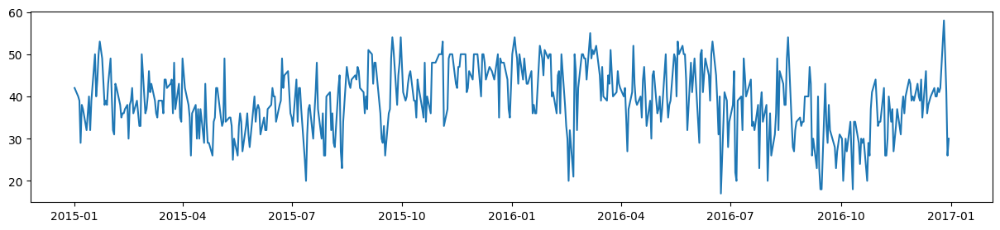

In [12]:
plt.figure(figsize=(15,3))

df_2015_2017 = df[(df['date'] >= '2015-01-01') & (df['date'] <= '2017-01-01')]
plt.plot(df_2015_2017['date'], df_2015_2017['Am'])

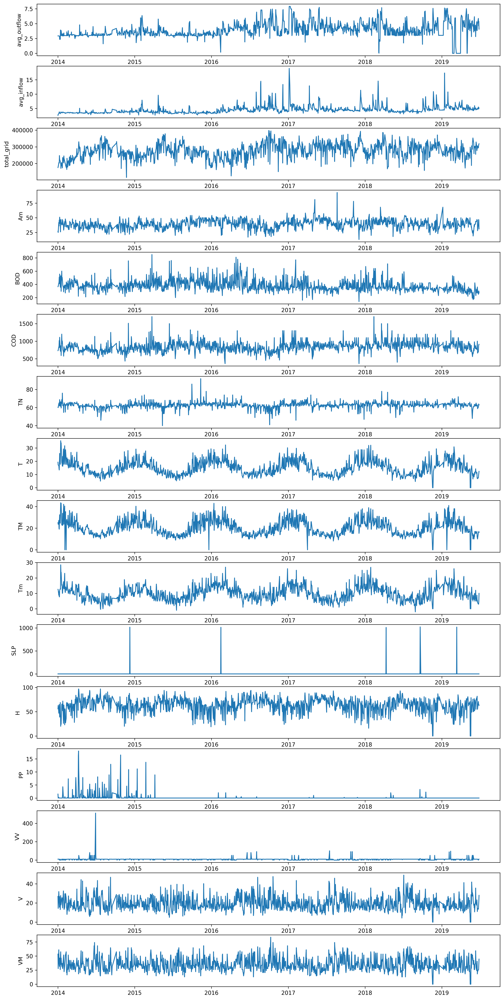

In [13]:
columns_to_plot = ['avg_outflow','avg_inflow','total_grid','Am','BOD','COD','TN','T','TM','Tm','SLP','H','PP','VV','V','VM']

num_rows = 16
num_columns = 1

fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 32), dpi = 300)

for i in range(len(columns_to_plot)):
    axes[i].plot(df['date'], df[columns_to_plot[i]])
    axes[i].set_ylabel(columns_to_plot[i])
    
plt.show()

In [14]:
level1_df = df[df['consumption_level'] == 'level 1']
level2_df = df[df['consumption_level'] == 'level 2']
level3_df = df[df['consumption_level'] == 'level 3']

In [15]:
level3_df

,avg_outflow,avg_inflow,total_grid,Am,BOD,COD,TN,T,TM,Tm,...,H,PP,VV,V,VM,year,month,day,consumption_level,date
70,2.905,3.380,310372,32.0,365.0,730.0,61.240,16.4,17.5,16.0,...,97,18.03,6.3,10.9,18.3,2014,4,9,level 3,2014-04-09
71,3.009,3.468,330334,24.0,323.0,646.0,59.603,17.1,18.2,16.0,...,96,10.41,51.1,14.6,33.5,2014,4,10,level 3,2014-04-10
89,3.138,3.339,305726,41.0,385.0,770.0,60.757,8.1,14.5,3.0,...,73,0.25,10.0,14.1,25.9,2014,5,7,level 3,2014-05-07
100,2.806,3.325,304978,33.0,408.0,816.0,61.496,17.8,21.0,14.6,...,65,3.30,9.8,22.2,40.7,2014,5,22,level 3,2014-05-22
125,2.960,3.306,316848,43.0,360.0,720.0,60.786,11.8,15.0,6.7,...,66,0.00,0.0,27.4,51.9,2014,6,26,level 3,2014-06-26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1372,3.805,4.558,329105,43.0,300.0,810.0,65.000,12.1,16.0,5.0,...,75,0.00,9.8,19.1,29.4,2019,6,13,level 3,2019-06-13
1377,5.068,4.716,305938,28.0,310.0,660.0,58.807,6.8,10.0,4.0,...,56,0.00,10.0,14.4,22.2,2019,6,20,level 3,2019-06-20
1379,4.638,4.811,307968,47.0,260.0,860.0,64.000,9.7,16.0,3.0,...,65,0.00,10.0,18.1,25.9,2019,6,25,level 3,2019-06-25
1380,5.373,4.929,316675,46.0,300.0,900.0,62.479,10.9,17.0,5.0,...,65,0.00,10.0,21.9,35.2,2019,6,26,level 3,2019-06-26


### Energy Consumption: Level 1 - Dataset

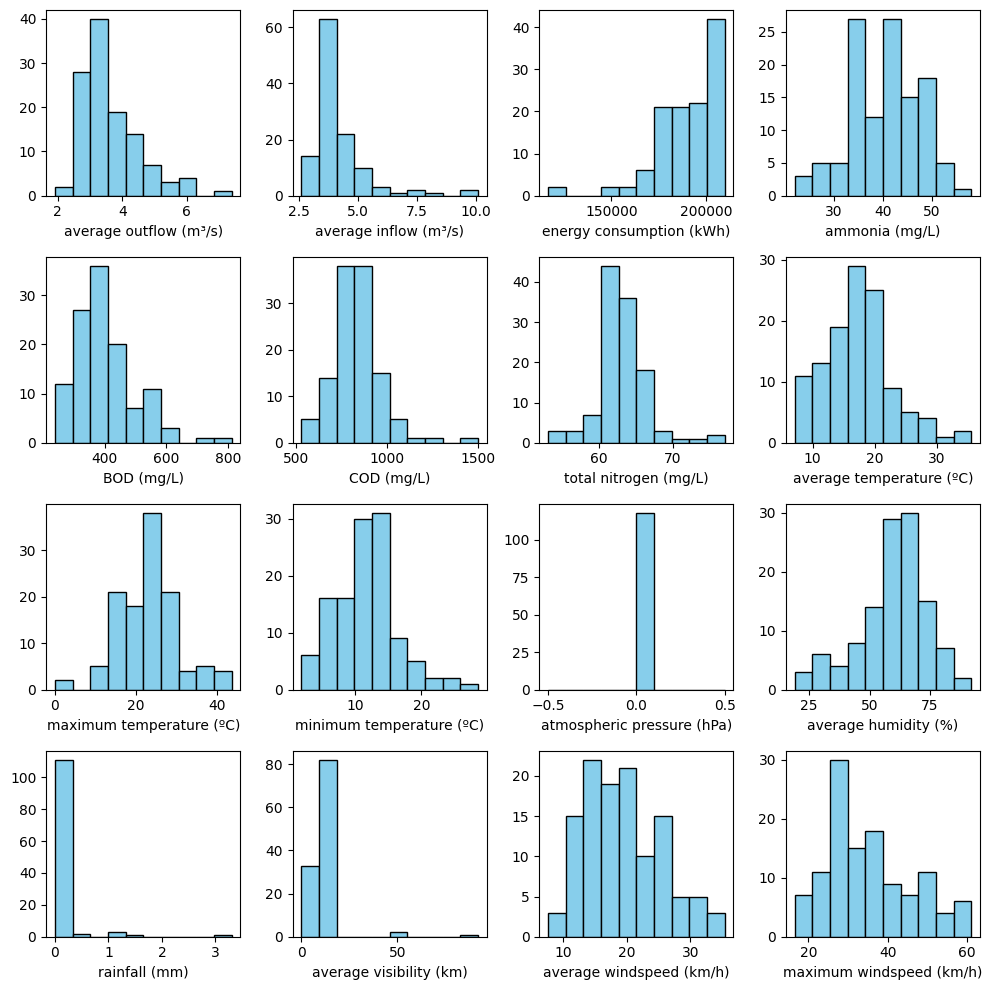

In [16]:
columns_to_plot = ['avg_outflow','avg_inflow','total_grid','Am','BOD','COD','TN','T','TM','Tm','SLP','H','PP','VV','V','VM','VG']

num_columns = 4
num_rows = 4

fig, axes = plt.subplots(num_rows, num_columns, figsize=(10, 10))

axes = axes.flatten()

axes[0].hist(level1_df['avg_outflow'], bins=10, color='#87ceeb', edgecolor='black')
axes[0].set_xlabel('average outflow (m³/s)')

axes[1].hist(level1_df['avg_inflow'], bins=10, color='#87ceeb', edgecolor='black')
axes[1].set_xlabel('average inflow (m³/s)')

axes[2].hist(level1_df['total_grid'], bins=10, color='#87ceeb', edgecolor='black')
axes[2].set_xlabel('energy consumption (kWh)')

axes[3].hist(level1_df['Am'], bins=10, color='#87ceeb', edgecolor='black')
axes[3].set_xlabel('ammonia (mg/L)')

axes[4].hist(level1_df['BOD'], bins=10, color='#87ceeb', edgecolor='black')
axes[4].set_xlabel('BOD (mg/L)')

axes[5].hist(level1_df['COD'], bins=10, color='#87ceeb', edgecolor='black')
axes[5].set_xlabel('COD (mg/L)')

axes[6].hist(level1_df['TN'], bins=10, color='#87ceeb', edgecolor='black')
axes[6].set_xlabel('total nitrogen (mg/L)')

axes[7].hist(level1_df['T'], bins=10, color='#87ceeb', edgecolor='black')
axes[7].set_xlabel('average temperature (ºC)')

axes[8].hist(level1_df['TM'], bins=10, color='#87ceeb', edgecolor='black')
axes[8].set_xlabel('maximum temperature (ºC)')

axes[9].hist(level1_df['Tm'], bins=10, color='#87ceeb', edgecolor='black')
axes[9].set_xlabel('minimum temperature (ºC)')

axes[10].hist(level1_df['SLP'], bins=10, color='#87ceeb', edgecolor='black')
axes[10].set_xlabel('atmospheric pressure (hPa)')

axes[11].hist(level1_df['H'], bins=10, color='#87ceeb', edgecolor='black')
axes[11].set_xlabel('average humidity (%)')

axes[12].hist(level1_df['PP'], bins=10, color='#87ceeb', edgecolor='black')
axes[12].set_xlabel('rainfall (mm)')

axes[13].hist(level1_df['VV'], bins=10, color='#87ceeb', edgecolor='black')
axes[13].set_xlabel('average visibility (km)')

axes[14].hist(level1_df['V'], bins=10, color='#87ceeb', edgecolor='black')
axes[14].set_xlabel('average windspeed (km/h)')

axes[15].hist(level1_df['VM'], bins=10, color='#87ceeb', edgecolor='black')
axes[15].set_xlabel('maximum windspeed (km/h)')

plt.tight_layout()

plt.show()

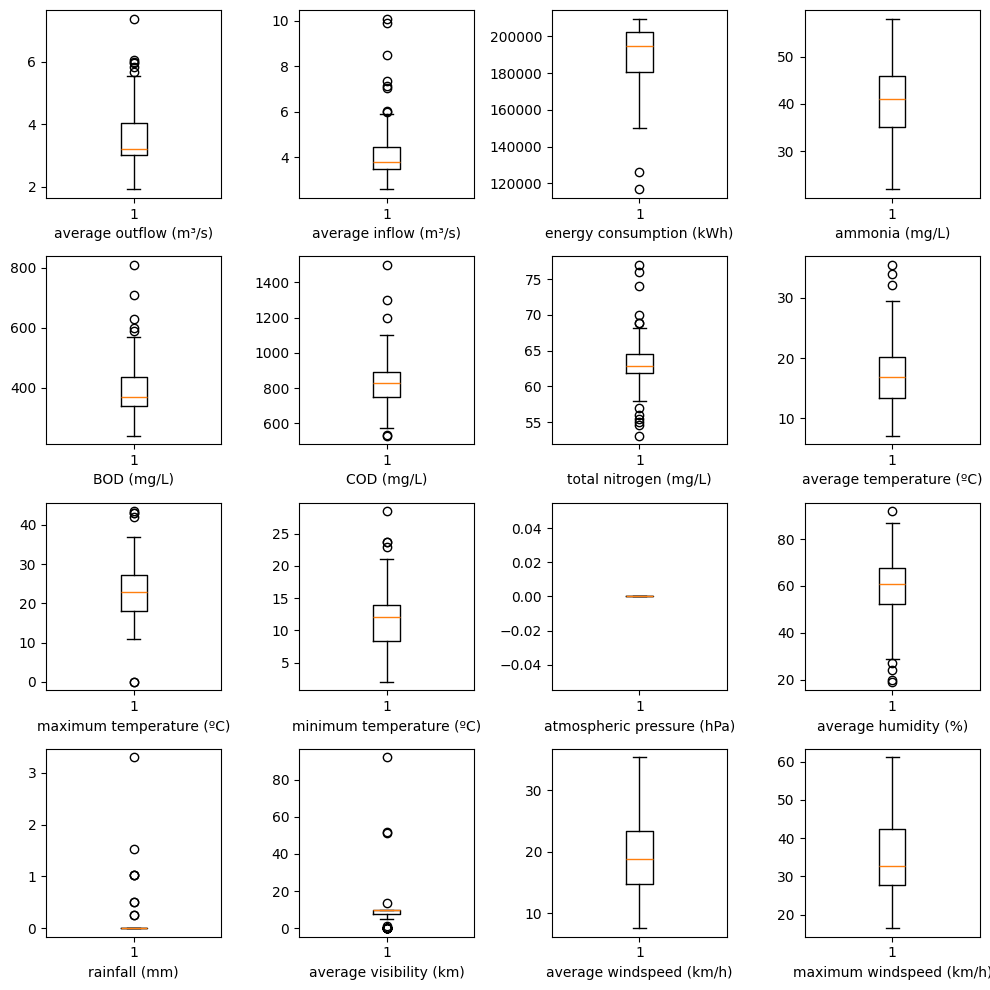

In [17]:
columns_to_plot = ['avg_outflow','avg_inflow','total_grid','Am','BOD','COD','TN','T','TM','Tm','SLP','H','PP','VV','V','VM','VG']

num_columns = 4
num_rows = 4

fig, axes = plt.subplots(num_rows, num_columns, figsize=(10, 10))

axes = axes.flatten()

axes[0].boxplot(level1_df['avg_outflow'])
axes[0].set_xlabel('average outflow (m³/s)')

axes[1].boxplot(level1_df['avg_inflow'])
axes[1].set_xlabel('average inflow (m³/s)')

axes[2].boxplot(level1_df['total_grid'])
axes[2].set_xlabel('energy consumption (kWh)')

axes[3].boxplot(level1_df['Am'])
axes[3].set_xlabel('ammonia (mg/L)')

axes[4].boxplot(level1_df['BOD'])
axes[4].set_xlabel('BOD (mg/L)')

axes[5].boxplot(level1_df['COD'])
axes[5].set_xlabel('COD (mg/L)')

axes[6].boxplot(level1_df['TN'])
axes[6].set_xlabel('total nitrogen (mg/L)')

axes[7].boxplot(level1_df['T'])
axes[7].set_xlabel('average temperature (ºC)')

axes[8].boxplot(level1_df['TM'])
axes[8].set_xlabel('maximum temperature (ºC)')

axes[9].boxplot(level1_df['Tm'])
axes[9].set_xlabel('minimum temperature (ºC)')

axes[10].boxplot(level1_df['SLP'])
axes[10].set_xlabel('atmospheric pressure (hPa)')

axes[11].boxplot(level1_df['H'])
axes[11].set_xlabel('average humidity (%)')

axes[12].boxplot(level1_df['PP'])
axes[12].set_xlabel('rainfall (mm)')

axes[13].boxplot(level1_df['VV'])
axes[13].set_xlabel('average visibility (km)')

axes[14].boxplot(level1_df['V'])
axes[14].set_xlabel('average windspeed (km/h)')

axes[15].boxplot(level1_df['VM'])
axes[15].set_xlabel('maximum windspeed (km/h)')

plt.tight_layout()

plt.show()

In [18]:
l1_numeric_df = level1_df.select_dtypes(include=['number'])

l1_num_observations = l1_numeric_df.shape[0]                                              # number of observations
l1_column_sums = l1_numeric_df.sum()                                                      # sum of every column
l1_mean_d = l1_column_sums/l1_num_observations                                               # mean of every column

l1_std_d = {column: calculate_std(values) for column, values in l1_numeric_df.items()}    # variance of every column
l1_std_d = pd.Series(l1_std_d)

l1_skw_d = {column: calculate_skw(values) for column, values in l1_numeric_df.items()}    # skewness of every column
l1_skw_d = pd.Series(skw_d)

3.6166355932203387
4.170957627118644
190157.7372881356
40.47457627118644
399.1772881355932
834.5410169491525
63.145711864406785
17.361016949152543
22.97966101694915
11.727118644067795
0.0
59.47457627118644
0.07966101694915255
9.098305084745762
19.43983050847458
35.2364406779661
2015.584745762712
4.686440677966102
15.09322033898305


In [19]:
l1_data_stats = {'unity': data_units, 'mean': l1_mean_d, 'standard deviation': l1_std_d, 'skewness': l1_skw_d}
l1_df_stats = pd.DataFrame(l1_data_stats)
l1_df_stats.index = row_titles

l1_styled_df = l1_df_stats.style.set_table_styles(
    [{'selector': 'th', 'props': [('text-align', 'left')]},         # align column headers
     {'selector': 'td', 'props': [('text-align', 'center')]},       # align data to the center
     {'selector': 'thead th', 'props': [('text-align', 'center')]}    # ensure headers are aligned left
    ], axis=None)

l1_styled_df = l1_styled_df.format({
    'mean': '{:.2f}',  # 2 decimal places for Series 1
    'standard deviation': '{:.3f}',  # 3 decimal places for Series 2
    'skewness': '{:.1f}'   # 1 decimal place for Series 3
})

display(l1_styled_df)

,unity,mean,standard deviation,skewness
Average outflow (Qout),m³/s,3.62,0.896,0.4
Average inflow (Qin),m³/s,4.17,1.197,3.7
Energy consumption (EC),kWh,190157.74,16349.198,-0.1
Ammonia (NH4),mg/L,40.47,7.104,0.3
Biological Oxygen Demand (BOD),mg/L,399.18,96.217,1.2
Chemical Oxygen Demand (COD),mg/L,834.54,137.399,0.7
Total Nitrogen (TN),mg/L,63.15,3.422,-0.3
Average Temperature (T),°C,17.36,5.444,0.6
Maximum Temperature (TM),°C,22.98,7.454,0.5
Minimum Temperature (Tm),°C,11.73,4.617,0.5


### Energy Consumption: Level 2 - Dataset

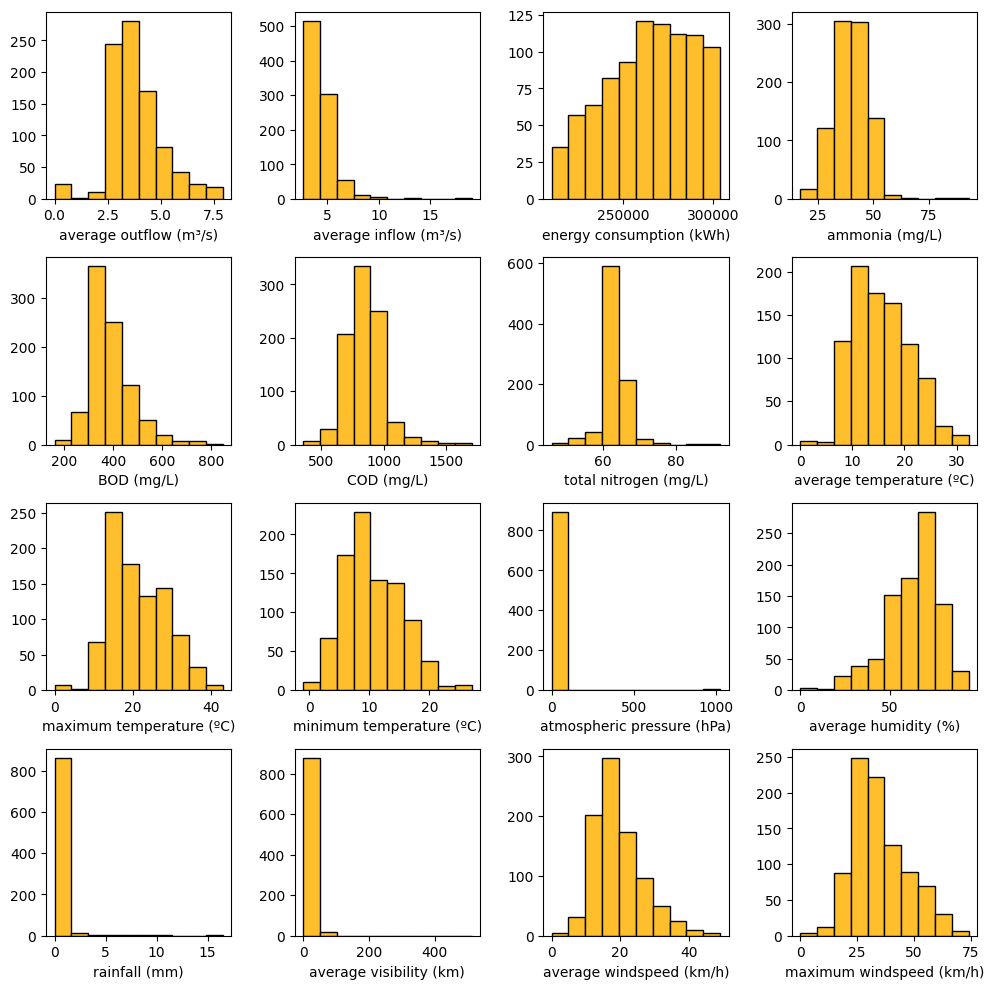

In [20]:
columns_to_plot = ['avg_outflow','avg_inflow','total_grid','Am','BOD','COD','TN','T','TM','Tm','SLP','H','PP','VV','V','VM','VG']

num_columns = 4
num_rows = 4

fig, axes = plt.subplots(num_rows, num_columns, figsize=(10, 10))

axes = axes.flatten()

axes[0].hist(level2_df['avg_outflow'], bins=10, color='#ffbf2d', edgecolor='black')
axes[0].set_xlabel('average outflow (m³/s)')

axes[1].hist(level2_df['avg_inflow'], bins=10, color='#ffbf2d', edgecolor='black')
axes[1].set_xlabel('average inflow (m³/s)')

axes[2].hist(level2_df['total_grid'], bins=10, color='#ffbf2d', edgecolor='black')
axes[2].set_xlabel('energy consumption (kWh)')

axes[3].hist(level2_df['Am'], bins=10, color='#ffbf2d', edgecolor='black')
axes[3].set_xlabel('ammonia (mg/L)')

axes[4].hist(level2_df['BOD'], bins=10, color='#ffbf2d', edgecolor='black')
axes[4].set_xlabel('BOD (mg/L)')

axes[5].hist(level2_df['COD'], bins=10, color='#ffbf2d', edgecolor='black')
axes[5].set_xlabel('COD (mg/L)')

axes[6].hist(level2_df['TN'], bins=10, color='#ffbf2d', edgecolor='black')
axes[6].set_xlabel('total nitrogen (mg/L)')

axes[7].hist(level2_df['T'], bins=10, color='#ffbf2d', edgecolor='black')
axes[7].set_xlabel('average temperature (ºC)')

axes[8].hist(level2_df['TM'], bins=10, color='#ffbf2d', edgecolor='black')
axes[8].set_xlabel('maximum temperature (ºC)')

axes[9].hist(level2_df['Tm'], bins=10, color='#ffbf2d', edgecolor='black')
axes[9].set_xlabel('minimum temperature (ºC)')

axes[10].hist(level2_df['SLP'], bins=10, color='#ffbf2d', edgecolor='black')
axes[10].set_xlabel('atmospheric pressure (hPa)')

axes[11].hist(level2_df['H'], bins=10, color='#ffbf2d', edgecolor='black')
axes[11].set_xlabel('average humidity (%)')

axes[12].hist(level2_df['PP'], bins=10, color='#ffbf2d', edgecolor='black')
axes[12].set_xlabel('rainfall (mm)')

axes[13].hist(level2_df['VV'], bins=10, color='#ffbf2d', edgecolor='black')
axes[13].set_xlabel('average visibility (km)')

axes[14].hist(level2_df['V'], bins=10, color='#ffbf2d', edgecolor='black')
axes[14].set_xlabel('average windspeed (km/h)')

axes[15].hist(level2_df['VM'], bins=10, color='#ffbf2d', edgecolor='black')
axes[15].set_xlabel('maximum windspeed (km/h)')

plt.tight_layout()

plt.show()

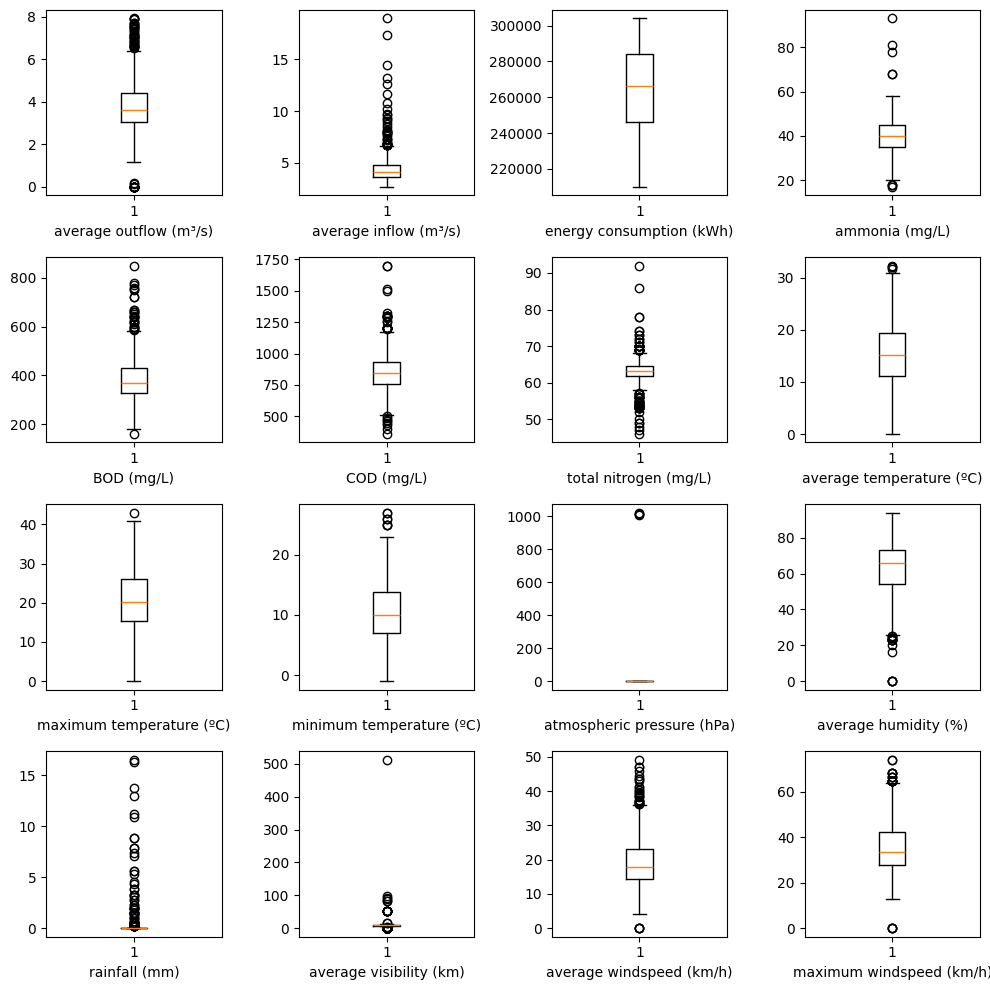

In [21]:
columns_to_plot = ['avg_outflow','avg_inflow','total_grid','Am','BOD','COD','TN','T','TM','Tm','SLP','H','PP','VV','V','VM','VG']

num_columns = 4
num_rows = 4

fig, axes = plt.subplots(num_rows, num_columns, figsize=(10, 10))

axes = axes.flatten()

axes[0].boxplot(level2_df['avg_outflow'])
axes[0].set_xlabel('average outflow (m³/s)')

axes[1].boxplot(level2_df['avg_inflow'])
axes[1].set_xlabel('average inflow (m³/s)')

axes[2].boxplot(level2_df['total_grid'])
axes[2].set_xlabel('energy consumption (kWh)')

axes[3].boxplot(level2_df['Am'])
axes[3].set_xlabel('ammonia (mg/L)')

axes[4].boxplot(level2_df['BOD'])
axes[4].set_xlabel('BOD (mg/L)')

axes[5].boxplot(level2_df['COD'])
axes[5].set_xlabel('COD (mg/L)')

axes[6].boxplot(level2_df['TN'])
axes[6].set_xlabel('total nitrogen (mg/L)')

axes[7].boxplot(level2_df['T'])
axes[7].set_xlabel('average temperature (ºC)')

axes[8].boxplot(level2_df['TM'])
axes[8].set_xlabel('maximum temperature (ºC)')

axes[9].boxplot(level2_df['Tm'])
axes[9].set_xlabel('minimum temperature (ºC)')

axes[10].boxplot(level2_df['SLP'])
axes[10].set_xlabel('atmospheric pressure (hPa)')

axes[11].boxplot(level2_df['H'])
axes[11].set_xlabel('average humidity (%)')

axes[12].boxplot(level2_df['PP'])
axes[12].set_xlabel('rainfall (mm)')

axes[13].boxplot(level2_df['VV'])
axes[13].set_xlabel('average visibility (km)')

axes[14].boxplot(level2_df['V'])
axes[14].set_xlabel('average windspeed (km/h)')

axes[15].boxplot(level2_df['VM'])
axes[15].set_xlabel('maximum windspeed (km/h)')

plt.tight_layout()

plt.show()

In [22]:
l2_numeric_df = level2_df.select_dtypes(include=['number'])

l2_num_observations = l2_numeric_df.shape[0]                                              # number of observations
l2_column_sums = l2_numeric_df.sum()                                                      # sum of every column
l2_mean_d = l2_column_sums/l2_num_observations                                            # mean of every column

l2_std_d = {column: calculate_std(values) for column, values in l2_numeric_df.items()}    # variance of every column
l2_std_d = pd.Series(l2_std_d)

l2_skw_d = {column: calculate_skw(values) for column, values in l2_numeric_df.items()}    # skewness of every column
l2_skw_d = pd.Series(skw_d)

3.8513523823372595
4.439139353400223
264174.4581939799
39.83971237458194
387.57025641025643
851.5004236343367
63.091431438127096
15.590189520624303
21.259308807134893
10.443701226309923
4.527759197324415
62.702341137123746
0.2502452619843924
9.140245261984392
19.439353400222963
35.28405797101449
2016.2240802675585
5.935340022296544
15.373467112597547


In [23]:
l2_data_stats = {'unity': data_units, 'mean': l2_mean_d, 'standard deviation': l2_std_d, 'skewness': l2_skw_d}
l2_df_stats = pd.DataFrame(l2_data_stats)
l2_df_stats.index = row_titles

l2_styled_df = l2_df_stats.style.set_table_styles(
    [{'selector': 'th', 'props': [('text-align', 'left')]},         # align column headers
     {'selector': 'td', 'props': [('text-align', 'center')]},       # align data to the center
     {'selector': 'thead th', 'props': [('text-align', 'center')]}    # ensure headers are aligned left
    ], axis=None)

l2_styled_df = l2_styled_df.format({
    'mean': '{:.2f}',  # 2 decimal places for Series 1
    'standard deviation': '{:.3f}',  # 3 decimal places for Series 2
    'skewness': '{:.1f}'   # 1 decimal place for Series 3
})

display(l2_styled_df)

,unity,mean,standard deviation,skewness
Average outflow (Qout),m³/s,3.85,1.258,0.4
Average inflow (Qin),m³/s,4.44,1.363,3.7
Energy consumption (EC),kWh,264174.46,24360.745,-0.1
Ammonia (NH4),mg/L,39.84,7.711,0.3
Biological Oxygen Demand (BOD),mg/L,387.57,88.483,1.2
Chemical Oxygen Demand (COD),mg/L,851.50,144.208,0.7
Total Nitrogen (TN),mg/L,63.09,3.426,-0.3
Average Temperature (T),°C,15.59,5.469,0.6
Maximum Temperature (TM),°C,21.26,7.254,0.5
Minimum Temperature (Tm),°C,10.44,4.736,0.5


### Energy Consumption: Level 3 - Dataset

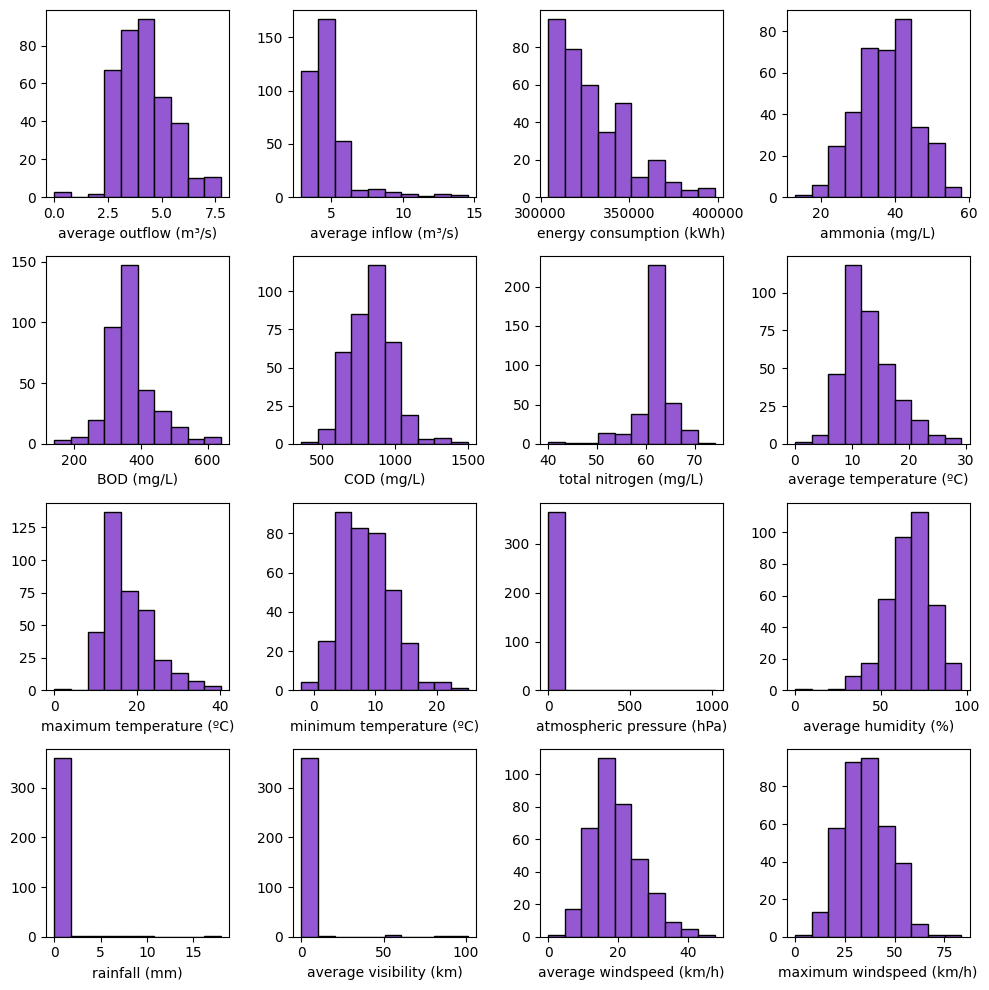

In [24]:
columns_to_plot = ['avg_outflow','avg_inflow','total_grid','Am','BOD','COD','TN','T','TM','Tm','SLP','H','PP','VV','V','VM','VG']

num_columns = 4
num_rows = 4

fig, axes = plt.subplots(num_rows, num_columns, figsize=(10, 10))

axes = axes.flatten()

axes[0].hist(level3_df['avg_outflow'], bins=10, color='#9459d2', edgecolor='black')
axes[0].set_xlabel('average outflow (m³/s)')

axes[1].hist(level3_df['avg_inflow'], bins=10, color='#9459d2', edgecolor='black')
axes[1].set_xlabel('average inflow (m³/s)')

axes[2].hist(level3_df['total_grid'], bins=10, color='#9459d2', edgecolor='black')
axes[2].set_xlabel('energy consumption (kWh)')

axes[3].hist(level3_df['Am'], bins=10, color='#9459d2', edgecolor='black')
axes[3].set_xlabel('ammonia (mg/L)')

axes[4].hist(level3_df['BOD'], bins=10, color='#9459d2', edgecolor='black')
axes[4].set_xlabel('BOD (mg/L)')

axes[5].hist(level3_df['COD'], bins=10, color='#9459d2', edgecolor='black')
axes[5].set_xlabel('COD (mg/L)')

axes[6].hist(level3_df['TN'], bins=10, color='#9459d2', edgecolor='black')
axes[6].set_xlabel('total nitrogen (mg/L)')

axes[7].hist(level3_df['T'], bins=10, color='#9459d2', edgecolor='black')
axes[7].set_xlabel('average temperature (ºC)')

axes[8].hist(level3_df['TM'], bins=10, color='#9459d2', edgecolor='black')
axes[8].set_xlabel('maximum temperature (ºC)')

axes[9].hist(level3_df['Tm'], bins=10, color='#9459d2', edgecolor='black')
axes[9].set_xlabel('minimum temperature (ºC)')

axes[10].hist(level3_df['SLP'], bins=10, color='#9459d2', edgecolor='black')
axes[10].set_xlabel('atmospheric pressure (hPa)')

axes[11].hist(level3_df['H'], bins=10, color='#9459d2', edgecolor='black')
axes[11].set_xlabel('average humidity (%)')

axes[12].hist(level3_df['PP'], bins=10, color='#9459d2', edgecolor='black')
axes[12].set_xlabel('rainfall (mm)')

axes[13].hist(level3_df['VV'], bins=10, color='#9459d2', edgecolor='black')
axes[13].set_xlabel('average visibility (km)')

axes[14].hist(level3_df['V'], bins=10, color='#9459d2', edgecolor='black')
axes[14].set_xlabel('average windspeed (km/h)')

axes[15].hist(level3_df['VM'], bins=10, color='#9459d2', edgecolor='black')
axes[15].set_xlabel('maximum windspeed (km/h)')

plt.tight_layout()

plt.show()

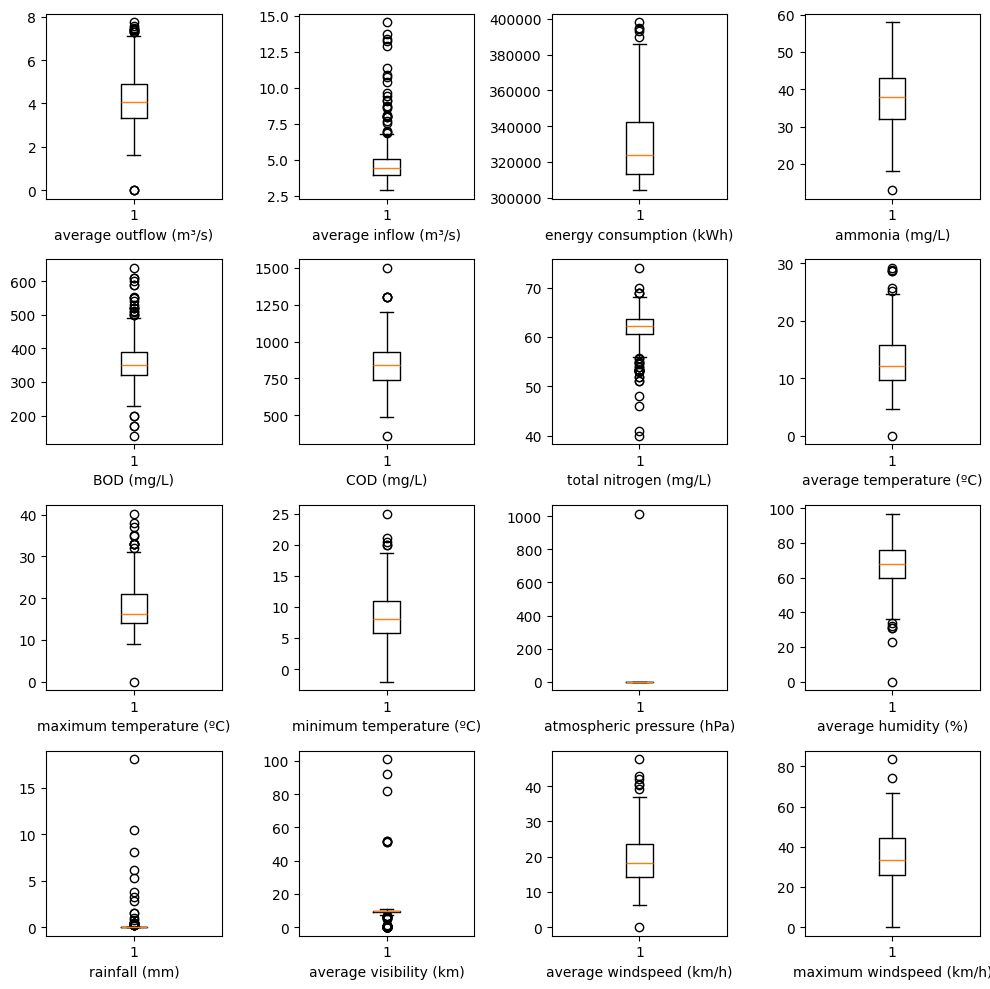

In [25]:
columns_to_plot = ['avg_outflow','avg_inflow','total_grid','Am','BOD','COD','TN','T','TM','Tm','SLP','H','PP','VV','V','VM','VG']

num_columns = 4
num_rows = 4

fig, axes = plt.subplots(num_rows, num_columns, figsize=(10, 10))

axes = axes.flatten()

axes[0].boxplot(level3_df['avg_outflow'])
axes[0].set_xlabel('average outflow (m³/s)')

axes[1].boxplot(level3_df['avg_inflow'])
axes[1].set_xlabel('average inflow (m³/s)')

axes[2].boxplot(level3_df['total_grid'])
axes[2].set_xlabel('energy consumption (kWh)')

axes[3].boxplot(level3_df['Am'])
axes[3].set_xlabel('ammonia (mg/L)')

axes[4].boxplot(level3_df['BOD'])
axes[4].set_xlabel('BOD (mg/L)')

axes[5].boxplot(level3_df['COD'])
axes[5].set_xlabel('COD (mg/L)')

axes[6].boxplot(level3_df['TN'])
axes[6].set_xlabel('total nitrogen (mg/L)')

axes[7].boxplot(level3_df['T'])
axes[7].set_xlabel('average temperature (ºC)')

axes[8].boxplot(level3_df['TM'])
axes[8].set_xlabel('maximum temperature (ºC)')

axes[9].boxplot(level3_df['Tm'])
axes[9].set_xlabel('minimum temperature (ºC)')

axes[10].boxplot(level3_df['SLP'])
axes[10].set_xlabel('atmospheric pressure (hPa)')

axes[11].boxplot(level3_df['H'])
axes[11].set_xlabel('average humidity (%)')

axes[12].boxplot(level3_df['PP'])
axes[12].set_xlabel('rainfall (mm)')

axes[13].boxplot(level3_df['VV'])
axes[13].set_xlabel('average visibility (km)')

axes[14].boxplot(level3_df['V'])
axes[14].set_xlabel('average windspeed (km/h)')

axes[15].boxplot(level3_df['VM'])
axes[15].set_xlabel('maximum windspeed (km/h)')

plt.tight_layout()

plt.show()

In [26]:
l3_numeric_df = level3_df.select_dtypes(include=['number'])

l3_num_observations = l3_numeric_df.shape[0]                                              # number of observations
l3_column_sums = l3_numeric_df.sum()                                                      # sum of every column
l3_mean_d = l3_column_sums/l3_num_observations                                            # mean of every column

l3_std_d = {column: calculate_std(values) for column, values in l3_numeric_df.items()}    # variance of every column
l3_std_d = pd.Series(l3_std_d)

l3_skw_d = {column: calculate_skw(values) for column, values in l3_numeric_df.items()}    # skewness of every column
l3_skw_d = pd.Series(skw_d)

4.225269778462268
4.77841416893733
329337.2179836512
37.310626702997276
363.09493188010896
836.0915531335149
61.75343596730245
12.936512261580381
17.963215258855588
8.5008174386921
2.7724795640326976
66.96457765667574
0.18400544959128065
9.008174386920981
19.602452316076295
35.66539509536785
2016.558583106267
7.275204359673024
16.258855585831064


In [27]:
l3_data_stats = {'unity': data_units, 'mean': l3_mean_d, 'standard deviation': l3_std_d, 'skewness': l3_skw_d}
l3_df_stats = pd.DataFrame(l3_data_stats)
l3_df_stats.index = row_titles

l3_styled_df = l3_df_stats.style.set_table_styles(
    [{'selector': 'th', 'props': [('text-align', 'left')]},         # align column headers
     {'selector': 'td', 'props': [('text-align', 'center')]},       # align data to the center
     {'selector': 'thead th', 'props': [('text-align', 'center')]}    # ensure headers are aligned left
    ], axis=None)

l3_styled_df = l3_styled_df.format({
    'mean': '{:.2f}',  # 2 decimal places for Series 1
    'standard deviation': '{:.3f}',  # 3 decimal places for Series 2
    'skewness': '{:.1f}'   # 1 decimal place for Series 3
})

display(l3_styled_df)

,unity,mean,standard deviation,skewness
Average outflow (Qout),m³/s,4.23,1.192,0.4
Average inflow (Qin),m³/s,4.78,1.635,3.7
Energy consumption (EC),kWh,329337.22,20224.115,-0.1
Ammonia (NH4),mg/L,37.31,7.750,0.3
Biological Oxygen Demand (BOD),mg/L,363.09,72.026,1.2
Chemical Oxygen Demand (COD),mg/L,836.09,149.861,0.7
Total Nitrogen (TN),mg/L,61.75,3.770,-0.3
Average Temperature (T),°C,12.94,4.487,0.6
Maximum Temperature (TM),°C,17.96,5.763,0.5
Minimum Temperature (Tm),°C,8.50,4.031,0.5


## Bivariate Analysis

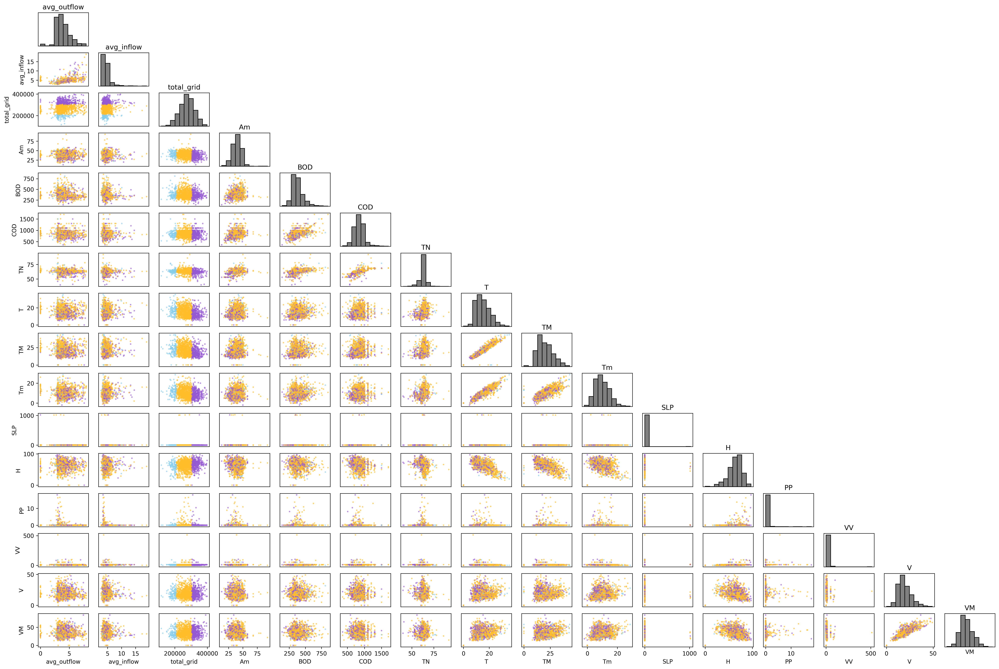

In [28]:
category_colors = {'level 1': '#87ceeb', 'level 2': '#ffbf2d', 'level 3': '#9459d2'}

df['color'] = df['consumption_level'].map(category_colors)

# ax = df.plot(kind='scatter', x='avg_inflow', y='avg_outflow', c=df['color'])
# axes[16].scatter(df['avg_outflow'], df['avg_inflow'], c=df['color'], s=3)

num_columns = 16
num_rows = 16

fig, axes = plt.subplots(num_rows, num_columns, figsize=(30, 20), dpi=300)

columns_to_plot = ['avg_outflow','avg_inflow','total_grid','Am','BOD','COD','TN','T','TM','Tm','SLP','H','PP','VV','V','VM']
titles = ['Outflow', 'Inflow', 'Energy Consumption', 'Ammonia', 'BOD', 'COD', 'Nitrogen', 'Temperature', 'Max Temperature', 'Min Temperature', 'Atmospheric Pressure', 'Humidity', 'Rainfall', 'Visibility', 'Wind', 'Max Wind']

k = 0

for i in range(len(columns_to_plot)): 
    for j in range(len(columns_to_plot)):
        if (j < k):
            axes[j,i].axis('off')
        elif(i==j):
            axes[i,i].hist(df[columns_to_plot[i]], bins=10, color='grey', edgecolor='black')
            axes[i,i].set_title(columns_to_plot[i])
            axes[i,i].set_yticks([])
            axes[i,i].set_xticks([])
        else:
            xcolumn = columns_to_plot[i]
            ycolumn = columns_to_plot[j]
            axes[j, i].scatter(df[xcolumn], df[ycolumn], c=df['color'], s=3, alpha=0.5)
            if (i > 0):
                axes[j, i].set_yticks([])
            if (j < len(columns_to_plot)-1):
                axes[j, i].set_xticks([])
    k = k + 1

for i in range(1,len(columns_to_plot)):
    axes[i,0].set_ylabel(columns_to_plot[i])

for i in range(len(columns_to_plot)):
    axes[len(columns_to_plot)-1,i].set_xlabel(columns_to_plot[i])

# plt.tight_layout()
plt.show()

#### **Calculate correlation**

In [29]:
columns_to_plot = ['avg_outflow','avg_inflow','total_grid','Am','BOD','COD','TN','T','TM','Tm','SLP','H','PP','VV','V','VM']

corr_mtx = np.zeros((len(columns_to_plot), len(columns_to_plot)))

for i in range(len(columns_to_plot)):
    for j in range(len(columns_to_plot)):
        column_i = df[columns_to_plot[i]]
        column_j = df[columns_to_plot[j]]

        mean_i = sum(column_i) / len(df[columns_to_plot[i]])
        mean_j = sum(column_j) / len(df[columns_to_plot[j]])

        sum_num = sum((column_i - mean_i)*(column_j - mean_j))

        sum_square_i = (sum((column_i - mean_i)**2))**(1/2)
        sum_square_j = (sum((column_j - mean_j)**2))**(1/2)

        corr_value = sum_num/(sum_square_i*sum_square_j)

        corr_mtx[i,j] = round(corr_value, 2)

In [30]:
cmap = LinearSegmentedColormap.from_list(
    'custom_cmap',
    [(0, '#4682b4'), (0.5, 'white'), (1, '#ff6347')],
    N=256
)

boundaries = np.linspace(-1,1,11)
norm = BoundaryNorm(boundaries, cmap.N)

mask = np.triu(np.ones_like(corr_mtx, dtype=bool), k=1)

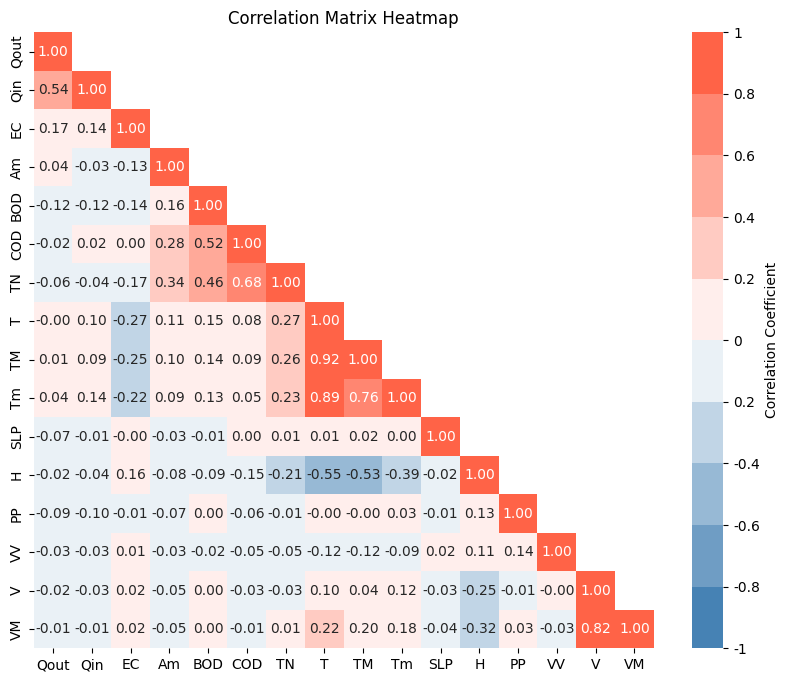

In [31]:
columns_to_plot = ['Qout','Qin','EC','Am','BOD','COD','TN','T','TM','Tm','SLP','H','PP','VV','V','VM']

plt.figure(figsize=(10,8))
sns.heatmap(corr_mtx,
            annot=True,
            cmap = cmap,
            fmt = '.2f',
            xticklabels=columns_to_plot,
            yticklabels=columns_to_plot,
            cbar_kws={'label': 'Correlation Coefficient'},
            center=0,
            vmin=-1,
            vmax=1,
            mask = mask,
            norm = norm)

cbar = plt.gca().collections[0].colorbar
cbar.set_ticks([-1, -0.8, -0.6, -0.4, -0.2, 0, 0.2, 0.4, 0.6, 0.8, 1])
cbar.set_ticklabels(['-1', '-0.8', '-0.6', '-0.4', '0.2', '0', '0.2', '0.4', '0.6', '0.8', '1'])

plt.title('Correlation Matrix Heatmap')
plt.show()

## **Principal Component Analysis**

In [32]:
df = df.drop(['TM', 'Tm', 'VM'], axis=1)

In [33]:
columns_to_plot = ['avg_outflow','avg_inflow','total_grid','Am','BOD','COD','TN','T','SLP','H','PP','VV','V']

### **Pre-processing**

In [34]:
df_normalised = df.copy()

means = df[columns_to_plot].mean()
stds = df[columns_to_plot].std()

df_normalised[columns_to_plot] = (df[columns_to_plot] - means) / stds

In [36]:
mins = df_normalised[columns_to_plot].min()
maxes = df_normalised[columns_to_plot].max()
df_normalised[columns_to_plot] = (df_normalised[columns_to_plot] - mins) / maxes

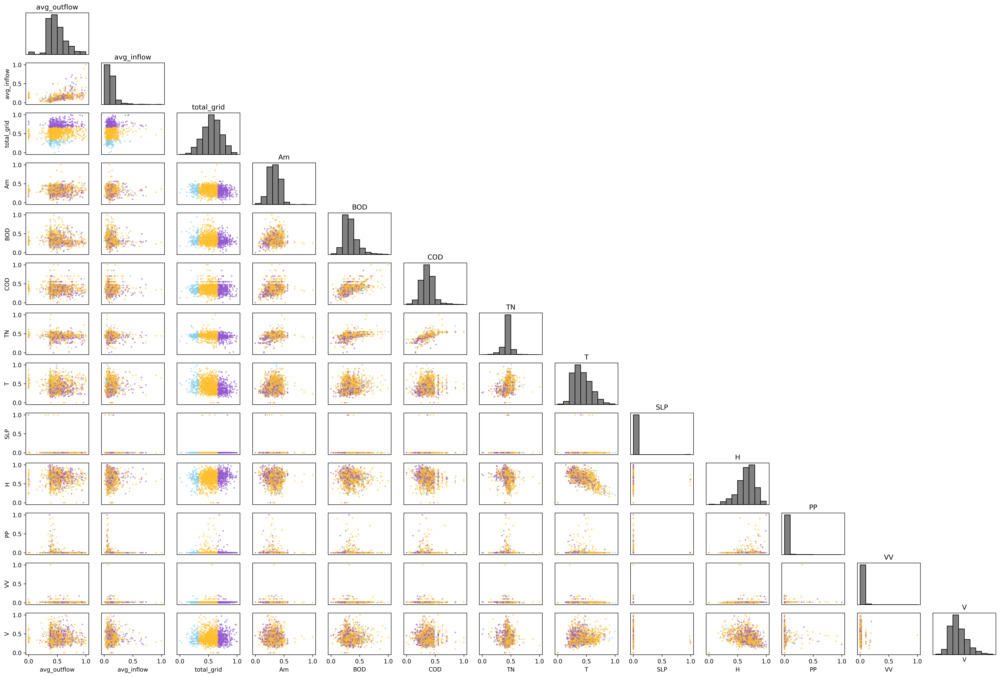

In [39]:
category_colors = {'level 1': '#87ceeb', 'level 2': '#ffbf2d', 'level 3': '#9459d2'}

df_normalised['color'] = df_normalised['consumption_level'].map(category_colors)

# ax = df_normalised.plot(kind='scatter', x='avg_inflow', y='avg_outflow', c=df_normalised['color'])
# axes[16].scatter(df_normalised['avg_outflow'], df_normalised['avg_inflow'], c=df_normalised['color'], s=3)

num_columns = 13
num_rows = 13

fig, axes = plt.subplots(num_rows, num_columns, figsize=(30, 20), dpi=300)

columns_to_plot = ['avg_outflow','avg_inflow','total_grid','Am','BOD','COD','TN','T','SLP','H','PP','VV','V']
titles = ['Outflow', 'Inflow', 'Energy Consumption', 'Ammonia', 'BOD', 'COD', 'Nitrogen', 'Temperature', 'Max Temperature', 'Min Temperature', 'Atmospheric Pressure', 'Humidity', 'Rainfall', 'Visibility', 'Wind', 'Max Wind']

k = 0

for i in range(len(columns_to_plot)): 
    for j in range(len(columns_to_plot)):
        if (j < k):
            axes[j,i].axis('off')
        elif(i==j):
            axes[i,i].hist(df_normalised[columns_to_plot[i]], bins=10, color='grey', edgecolor='black')
            axes[i,i].set_title(columns_to_plot[i])
            axes[i,i].set_yticks([])
            axes[i,i].set_xticks([])
        else:
            xcolumn = columns_to_plot[i]
            ycolumn = columns_to_plot[j]
            axes[j, i].scatter(df_normalised[xcolumn], df_normalised[ycolumn], c=df_normalised['color'], s=3, alpha=0.5)
            if (i > 0):
                axes[j, i].set_yticks([])
            if (j < len(columns_to_plot)-1):
                axes[j, i].set_xticks([])
    k = k + 1

for i in range(1,len(columns_to_plot)):
    axes[i,0].set_ylabel(columns_to_plot[i])

for i in range(len(columns_to_plot)):
    axes[len(columns_to_plot)-1,i].set_xlabel(columns_to_plot[i])

# plt.tight_layout()
plt.show()

In [44]:
cov_mtx = np.zeros((len(columns_to_plot), len(columns_to_plot)))

for i in range(len(columns_to_plot)):
    for j in range(len(columns_to_plot)):
        column_i = df_normalised[columns_to_plot[i]]
        column_j = df_normalised[columns_to_plot[j]]

        mean_i = sum(column_i) / len(column_i)
        mean_j = sum(column_j) / len(column_j)

        cov_mtx[i,j] = sum((column_i - mean_i)*(column_j - mean_j))/len(column_i)

In [45]:
cov_mtx

array([[ 2.40537539e-02,  7.38450648e-03,  4.10550805e-03,
         6.10545763e-04, -2.17473057e-03, -3.82303321e-04,
        -6.59589086e-04, -3.85161555e-06, -6.38064290e-04,
        -3.84687986e-04, -1.01142703e-03, -1.36589097e-04,
        -3.47176424e-04],
       [ 7.38450648e-03,  7.71941587e-03,  1.89584841e-03,
        -2.78720066e-04, -1.29105929e-03,  1.71803749e-04,
        -2.16093522e-04,  1.31088618e-03, -6.52872083e-05,
        -5.33423794e-04, -6.38909663e-04, -8.92437644e-05,
        -3.19287018e-04],
       [ 4.10550805e-03,  1.89584841e-03,  2.50958282e-02,
        -2.04458922e-03, -2.62669747e-03,  5.95290223e-06,
        -1.82101730e-03, -6.40702553e-03, -3.93286555e-05,
         3.68367007e-03, -1.63484220e-04,  3.57700633e-05,
         4.75461132e-04],
       [ 6.10545763e-04, -2.78720066e-04, -2.04458922e-03,
         9.40606380e-03,  1.93464205e-03,  2.99376447e-03,
         2.28362773e-03,  1.62175304e-03, -1.90460307e-04,
        -1.11811896e-03, -5.22235192e

In [54]:
cmap = LinearSegmentedColormap.from_list(
    'custom_cmap',
    [(0, '#4682b4'), (0.5, 'white'), (1, '#ff6347')],
    N=256
)

boundaries = np.linspace(cov_mtx.min(),cov_mtx.max(),11)
norm = BoundaryNorm(boundaries, cmap.N)

mask = np.triu(np.ones_like(cov_mtx, dtype=bool), k=1)

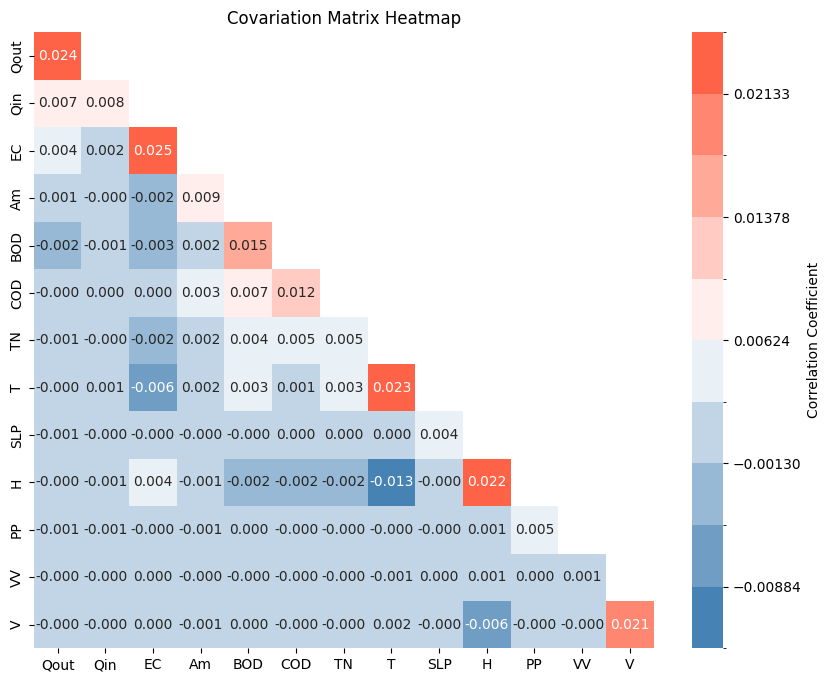

In [58]:
columns_to_plot = ['Qout','Qin','EC','Am','BOD','COD','TN','T','SLP','H','PP','VV','V']

plt.figure(figsize=(10,8))
sns.heatmap(cov_mtx,
            annot=True,
            cmap = cmap,
            fmt = '.3f',
            xticklabels=columns_to_plot,
            yticklabels=columns_to_plot,
            cbar_kws={'label': 'Correlation Coefficient'},
            # center=0,
            vmin = cov_mtx.min(),
            vmax= cov_mtx.max(),
            mask = mask,
            norm = norm)

cbar = plt.gca().collections[0].colorbar
# cbar.set_ticks([-1, -0.8, -0.6, -0.4, -0.2, 0, 0.2, 0.4, 0.6, 0.8, 1])
# cbar.set_ticklabels(['-1', '-0.8', '-0.6', '-0.4', '0.2', '0', '0.2', '0.4', '0.6', '0.8', '1'])

plt.title('Covariation Matrix Heatmap')
plt.show()

In [99]:
eigenvalues, eigenvectors = np.linalg.eig(cov_mtx)
print(eigenvalues)

[0.04248705 0.03000526 0.0232255  0.02130725 0.01659981 0.01003846
 0.008606   0.00600775 0.00512335 0.00423187 0.00350896 0.00097335
 0.00178404]


In [100]:
sorted_indices = np.argsort(eigenvalues)[::-1]

eigenvalues_sorted = eigenvalues[sorted_indices]
eigenvectors_sorted = eigenvectors[:,sorted_indices]

In [101]:
eigenvalues_sorted

array([0.04248705, 0.03000526, 0.0232255 , 0.02130725, 0.01659981,
       0.01003846, 0.008606  , 0.00600775, 0.00512335, 0.00423187,
       0.00350896, 0.00178404, 0.00097335])

In [107]:
df_pca = df_normalised.drop(['year', 'month', 'day', 'consumption_level', 'date', 'color'], axis=1)

df_pca = df_pca.dot(eigenvectors_sorted)

df_pca

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.149239,-0.324738,-0.127486,-0.463656,0.441549,0.820466,-0.385108,0.094820,-0.071777,0.238168,-0.062413,0.169325,-0.025135
1,0.014759,-0.255615,-0.310677,-0.438940,0.320276,0.778691,-0.338185,0.101097,0.008594,0.258086,-0.054037,0.169686,-0.030275
2,0.198434,-0.389290,-0.116827,-0.666534,0.516363,0.700604,-0.503108,0.055884,-0.005397,0.182674,-0.064209,0.209401,-0.028562
3,0.115666,-0.360536,-0.169709,-0.664918,0.470296,0.679823,-0.413671,0.067577,0.007770,0.187007,-0.058679,0.190627,-0.028601
4,0.046617,-0.250560,-0.395062,-0.773127,0.513672,0.722736,-0.499451,0.081208,0.028409,0.164169,-0.060042,0.173472,-0.027864
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1377,-0.367948,-0.645052,-0.264563,-0.604887,0.266411,0.592507,-0.335139,0.021462,-0.017806,0.181694,-0.059438,0.219261,-0.024925
1378,-0.432007,-0.681337,-0.388740,-0.544054,0.347829,0.636167,-0.525619,0.065486,-0.015647,0.191047,-0.067546,0.222006,-0.005586
1379,-0.305931,-0.610935,-0.299377,-0.709821,0.321095,0.614213,-0.631256,0.116170,-0.023462,0.195790,-0.063933,0.218397,-0.027810
1380,-0.285467,-0.708230,-0.296841,-0.756151,0.384309,0.667248,-0.607231,0.093613,-0.026438,0.213733,-0.070719,0.179435,-0.028951


In [103]:
explained_variance = eigenvalues_sorted/sum(eigenvalues_sorted)

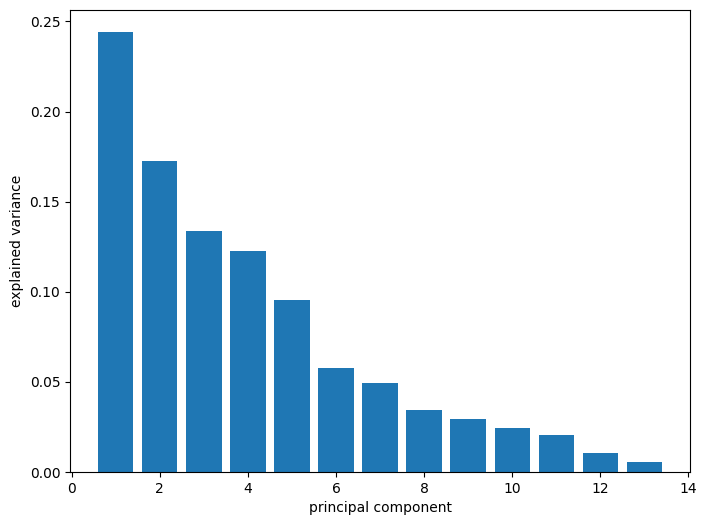

In [104]:
plt.figure(figsize=(8,6))
plt.bar(range(1, len(explained_variance)+1), explained_variance)
plt.xlabel('principal component')
plt.ylabel('explained variance')
plt.show()

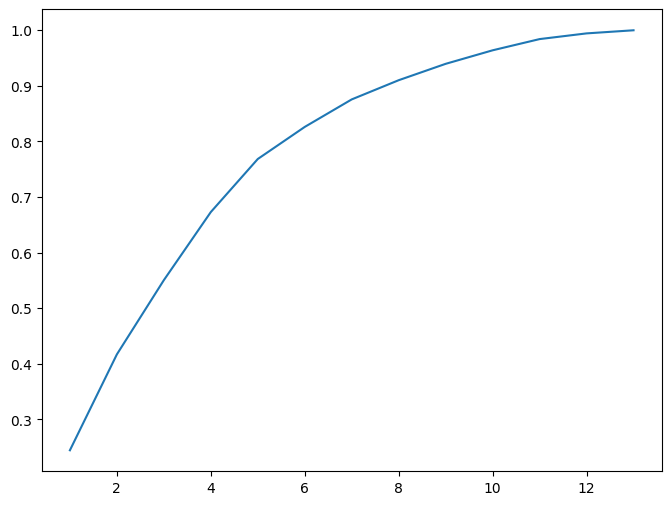

In [105]:
explained_variance_cumulative = np.cumsum(explained_variance)

plt.figure(figsize=(8,6))
plt.plot(range(1,len(explained_variance_cumulative)+1),explained_variance_cumulative)

In [115]:
df_pca['color'] = df['color']

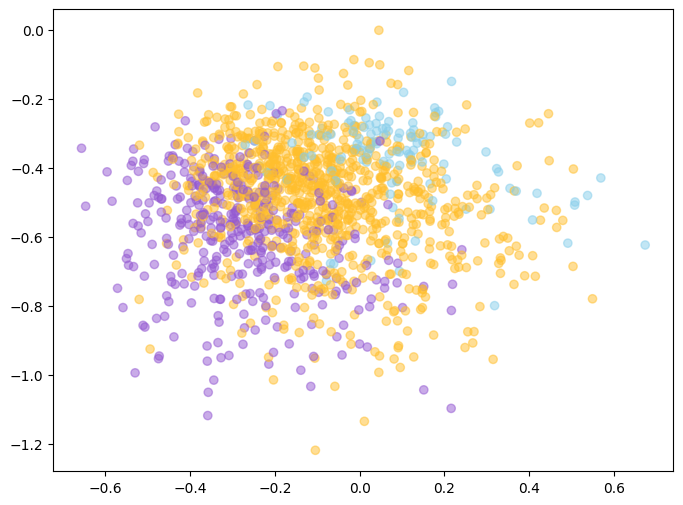

In [120]:
plt.figure(figsize=(8,6))
plt.scatter(df_pca[0], df_pca[1], alpha=0.5, c=df_pca['color'])

In [117]:
df_pca

,0,1,2,3,4,5,6,7,8,9,10,11,12,color
0,0.149239,-0.324738,-0.127486,-0.463656,0.441549,0.820466,-0.385108,0.094820,-0.071777,0.238168,-0.062413,0.169325,-0.025135,#87ceeb
1,0.014759,-0.255615,-0.310677,-0.438940,0.320276,0.778691,-0.338185,0.101097,0.008594,0.258086,-0.054037,0.169686,-0.030275,#87ceeb
2,0.198434,-0.389290,-0.116827,-0.666534,0.516363,0.700604,-0.503108,0.055884,-0.005397,0.182674,-0.064209,0.209401,-0.028562,#87ceeb
3,0.115666,-0.360536,-0.169709,-0.664918,0.470296,0.679823,-0.413671,0.067577,0.007770,0.187007,-0.058679,0.190627,-0.028601,#87ceeb
4,0.046617,-0.250560,-0.395062,-0.773127,0.513672,0.722736,-0.499451,0.081208,0.028409,0.164169,-0.060042,0.173472,-0.027864,#87ceeb
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1377,-0.367948,-0.645052,-0.264563,-0.604887,0.266411,0.592507,-0.335139,0.021462,-0.017806,0.181694,-0.059438,0.219261,-0.024925,#9459d2
1378,-0.432007,-0.681337,-0.388740,-0.544054,0.347829,0.636167,-0.525619,0.065486,-0.015647,0.191047,-0.067546,0.222006,-0.005586,#ffbf2d
1379,-0.305931,-0.610935,-0.299377,-0.709821,0.321095,0.614213,-0.631256,0.116170,-0.023462,0.195790,-0.063933,0.218397,-0.027810,#9459d2
1380,-0.285467,-0.708230,-0.296841,-0.756151,0.384309,0.667248,-0.607231,0.093613,-0.026438,0.213733,-0.070719,0.179435,-0.028951,#9459d2
